In [20]:
from signal import signal, SIGPIPE, SIG_DFL
signal(SIGPIPE, SIG_DFL)

<Handlers.SIG_IGN: 1>

# Workflow - last step train/test split validation and crossvalidation

Our aim is to test how precise and accurate our model is. In order to do so we need to find positive and negative sets for both training and testing. 

For our positives we will use [UniProt](https://www.uniprot.org/) databases to retrieve all those sequences that presents the Kunitz domain ([PF00014](https://pfam.xfam.org/family/PF00014)) and that were not used to produce our model. They should not have a resolved atomic structure. We will perform the search with the query:
```database:(type:pfam pf00014) AND reviewed:yes```
Results are: ```359```. For consistency we have to **remove** the sequences that were used to build the HMM. In order to do so we can use the [mapping tool](https://www.uniprot.org/uploadlists) from Uniprot itself. By uploading the [hmm id used](../hmm_project/hmm_seq_ids.list) into the tool and selecting from ```PDB``` to ```UniProt``` we'll be redirected into a new page where UniProt ID associated to the PDB structures can be retrieved. We'll download it uncompressed and we name them ```pdbtouniprot_seed.fasta```. 

With an in-house [Python script](./scripts/Nonredundantfasta.py) we extract only those sequences that do not belong to the hmm. The script run as follows:

```./scripts/Nonreduntantfasta.py [seed_file.fasta] [allsequences.fasta]```

Therefore our positives result into: ```345```



Our negatives will be all those sequences that do not present the kunitz domain. Number of result is ```561552```.

Then we will split our negatives and positives in 2 sets, by shuffling first the sequences and then splitting them in halves. This will be done with python script [split-fasta-random.py](./scripts/split-fasta-random.py)

```python split-fasta.py [file_input] [# of split] [prefix_output]```

In [1]:
!echo $(grep ">" Test-all_notPF00014.fasta | wc -l) + $(grep ">" Train-all_notPF00014.fasta | wc -l)
!grep ">" Train-all_notPF00014.fasta Test-all_notPF00014.fasta | wc -l

280925 + 280847
561772


In [2]:
!echo $(grep ">" Test-all_PF00014.fasta | wc -l) + $(grep ">" Train-all_PF00014.fasta | wc -l)
!grep ">" Test-all_PF00014.fasta  Train-all_PF00014.fasta | wc -l

172 + 172
344



<style type="text/css">.tg-sort-header::-moz-selection{background:0 0}.tg-sort-header::selection{background:0 0}.tg-sort-header{cursor:pointer}.tg-sort-header:after{content:'';float:right;margin-top:7px;border-width:0 5px 5px;border-style:solid;border-color:#404040 transparent;visibility:hidden}.tg-sort-header:hover:after{visibility:visible}.tg-sort-asc:after,.tg-sort-asc:hover:after,.tg-sort-desc:after{visibility:visible;opacity:.4}.tg-sort-desc:after{border-bottom:none;border-width:5px 5px 0}</style><table id="tg-F9xk1" style="border-collapse:collapse;border-spacing:0" class="tg"><tr><th style="border-bottom-width:1px;border-color:#000000;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal"></th><th style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal" colspan="2">Training</th><th style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal" colspan="2">Testing</th></tr><tr><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Sets</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">File name</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">n°</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">File name</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">n°</td></tr><tr><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">negatives</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Train-all_notPF00014.fasta</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">280847</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Test-all_notPF00014.fasta</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">280925</td></tr><tr><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;font-weight:bold;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">positives</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Train-all_PF00014.fasta</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">172</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">Test-all_PF00014</td><td style="border-bottom-width:1px;border-color:inherit;border-style:solid;border-top-width:1px;border-width:0px;font-family:Arial, sans-serif;font-size:14px;overflow:hidden;padding:10px 5px;text-align:center;vertical-align:top;word-break:normal">172</td></tr></table><script charset="utf-8">var TGSort=window.TGSort||function(n){"use strict";function r(n){return n?n.length:0}function t(n,t,e,o=0){for(e=r(n);o<e;++o)t(n[o],o)}function e(n){return n.split("").reverse().join("")}function o(n){var e=n[0];return t(n,function(n){for(;!n.startsWith(e);)e=e.substring(0,r(e)-1)}),r(e)}function u(n,r,e=[]){return t(n,function(n){r(n)&&e.push(n)}),e}var a=parseFloat;function i(n,r){return function(t){var e="";return t.replace(n,function(n,t,o){return e=t.replace(r,"")+"."+(o||"").substring(1)}),a(e)}}var s=i(/^(?:\s*)([+-]?(?:\d+)(?:,\d{3})*)(\.\d*)?$/g,/,/g),c=i(/^(?:\s*)([+-]?(?:\d+)(?:\.\d{3})*)(,\d*)?$/g,/\./g);function f(n){var t=a(n);return!isNaN(t)&&r(""+t)+1>=r(n)?t:NaN}function d(n){var e=[],o=n;return t([f,s,c],function(u){var a=[],i=[];t(n,function(n,r){r=u(n),a.push(r),r||i.push(n)}),r(i)<r(o)&&(o=i,e=a)}),r(u(o,function(n){return n==o[0]}))==r(o)?e:[]}function v(n){if("TABLE"==n.nodeName){for(var a=function(r){var e,o,u=[],a=[];return function n(r,e){e(r),t(r.childNodes,function(r){n(r,e)})}(n,function(n){"TR"==(o=n.nodeName)?(e=[],u.push(e),a.push(n)):"TD"!=o&&"TH"!=o||e.push(n)}),[u,a]}(),i=a[0],s=a[1],c=r(i),f=c>1&&r(i[0])<r(i[1])?1:0,v=f+1,p=i[f],h=r(p),l=[],g=[],N=[],m=v;m<c;++m){for(var T=0;T<h;++T){r(g)<h&&g.push([]);var C=i[m][T],L=C.textContent||C.innerText||"";g[T].push(L.trim())}N.push(m-v)}t(p,function(n,t){l[t]=0;var a=n.classList;a.add("tg-sort-header"),n.addEventListener("click",function(){var n=l[t];!function(){for(var n=0;n<h;++n){var r=p[n].classList;r.remove("tg-sort-asc"),r.remove("tg-sort-desc"),l[n]=0}}(),(n=1==n?-1:+!n)&&a.add(n>0?"tg-sort-asc":"tg-sort-desc"),l[t]=n;var i,f=g[t],m=function(r,t){return n*f[r].localeCompare(f[t])||n*(r-t)},T=function(n){var t=d(n);if(!r(t)){var u=o(n),a=o(n.map(e));t=d(n.map(function(n){return n.substring(u,r(n)-a)}))}return t}(f);(r(T)||r(T=r(u(i=f.map(Date.parse),isNaN))?[]:i))&&(m=function(r,t){var e=T[r],o=T[t],u=isNaN(e),a=isNaN(o);return u&&a?0:u?-n:a?n:e>o?n:e<o?-n:n*(r-t)});var C,L=N.slice();L.sort(m);for(var E=v;E<c;++E)(C=s[E].parentNode).removeChild(s[E]);for(E=v;E<c;++E)C.appendChild(s[v+L[E-v]])})})}}n.addEventListener("DOMContentLoaded",function(){for(var t=n.getElementsByClassName("tg"),e=0;e<r(t);++e)try{v(t[e])}catch(n){}})}(document)</script>

Once we have our sets, we can perfrom an ```hmmsearch``` in order to find one or more profiles against a sequence database ([documentation](https://www.mankier.com/1/hmmsearch)).

In [23]:
!grep "sp" positive_set.tab | wc -l 

345


In [4]:
!hmmsearch --noali --max --tblout positive_set1.tb6 -Z 1 ../hmm_project/kunitz_newlogo.hmm Train-all_PF00014.fasta

!tail +4 positive_set1.tb6 | head -172 > positive_set1.tab #we take out those lines that start with '#'

# hmmsearch :: search profile(s) against a sequence database
# HMMER 3.3 (Nov 2019); http://hmmer.org/
# Copyright (C) 2019 Howard Hughes Medical Institute.
# Freely distributed under the BSD open source license.
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
# query HMM file:                  ../hmm_project/kunitz_newlogo.hmm
# target sequence database:        Train-all_PF00014.fasta
# per-seq hits tabular output:     positive_set1.tb6
# show alignments in output:       no
# Max sensitivity mode:            on [all heuristic filters off]
# sequence search space set to:    1
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Query:       kunitz  [M=60]
Scores for complete sequences (score includes all domains):
   --- full sequence ---   --- best 1 domain ---    -#dom-
    E-value  score  bias    E-value  score  bias    exp  N  Sequence              Description
    ------- ------ -----    ------- ------ -----   ---- --  --------       

In [8]:
!grep "sp" positive_set1.tab | wc -l # number of sequences that are positive

172


In [6]:
!hmmsearch --noali --max --tblout positive_set2.tb6 -Z 1 ../hmm_project/kunitz_newlogo.hmm Test-all_PF00014.fasta


!tail +4 positive_set2.tb6 | head -172 > positive_set2.tab #we take out those lines that start with '#'

# hmmsearch :: search profile(s) against a sequence database
# HMMER 3.3 (Nov 2019); http://hmmer.org/
# Copyright (C) 2019 Howard Hughes Medical Institute.
# Freely distributed under the BSD open source license.
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
# query HMM file:                  ../hmm_project/kunitz_newlogo.hmm
# target sequence database:        Test-all_PF00014.fasta
# per-seq hits tabular output:     positive_set2.tb6
# show alignments in output:       no
# Max sensitivity mode:            on [all heuristic filters off]
# sequence search space set to:    1
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Query:       kunitz  [M=60]
Scores for complete sequences (score includes all domains):
   --- full sequence ---   --- best 1 domain ---    -#dom-
    E-value  score  bias    E-value  score  bias    exp  N  Sequence                  Description
    ------- ------ -----    ------- ------ -----   ---- --  --------    

In [9]:
!grep "sp" positive_set2.tab | wc -l # number of sequences that are positive

172


In [10]:
!hmmsearch --noali --max --cpu 8 --tblout negative_set1.tb6 -Z 1 ../hmm_project/kunitz_newlogo.hmm Train-all_notPF00014.fasta

!tail +4 negative_set1.tb6 | head -135265 > negative_set1.tab  #we take out those lines that start with '#'

# hmmsearch :: search profile(s) against a sequence database
# HMMER 3.3 (Nov 2019); http://hmmer.org/
# Copyright (C) 2019 Howard Hughes Medical Institute.
# Freely distributed under the BSD open source license.
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
# query HMM file:                  ../hmm_project/kunitz_newlogo.hmm
# target sequence database:        Train-all_notPF00014.fasta
# per-seq hits tabular output:     negative_set1.tb6
# show alignments in output:       no
# Max sensitivity mode:            on [all heuristic filters off]
# sequence search space set to:    1
# number of worker threads:        8
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Query:       kunitz  [M=60]
Scores for complete sequences (score includes all domains):
   --- full sequence ---   --- best 1 domain ---    -#dom-
    E-value  score  bias    E-value  score  bias    exp  N  Sequence                  Description
    ------- ------ -----    ---

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





>> sp|Q8F4J1|MURG_LEPIN  UDP-N-acetylglucosamine--N-acetylmuramyl-(pentapeptide) pyrophosphoryl-undecaprenol N-acetylglu
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|O24144|CAMT1_TOBAC  Caffeoyl-CoA O-methyltransferase 1 OS=Nicotiana tabacum OX=4097 GN=CCOAOMT1 PE=1 SV=1
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q46WG8|RS4_CUPPJ  30S ribosomal protein S4 OS=Cupriavidus pinatubonensis (strain JMP 134 / LMG 1197) OX=264198 GN=
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q8TQ11|BRIX_METAC  Probable Brix domain-containing ribosomal biogenesis protein OS=Methanosarcina acetivorans (str
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|P56517|HDAC1_CHICK  Histone deacetylase 1 OS=Gallus gallus OX=9031 GN=HDAC1 PE=2 SV=1
   [No individual domains that satisfy reporting thresholds

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Internal pipeline statistics summary:
-------------------------------------
Query model(s):                            1  (60 nodes)
Target sequences:                     280847  (101385859 residues searched)
Passed MSV filter:                    280847  (1); expected 280847.0 (1)
Passed bias filter:                   280847  (1); expected 280847.0 (1)
Passed Vit filter:                    280847  (1); expected 280847.0 (1)
Passed Fwd filter:                    280847  (1); expected 280847.0 (1)
Initial search space (Z):                  1  [as set by --Z on cmdline]
Domain search space  (domZ):          135265  [number of targets reported over threshold]
# CPU time: 116.19u 1.86s 00:01:58.05 Elapsed: 00:00:37.73
# Mc/sec: 161.21
//
[ok]


In [11]:
!grep "sp" negative_set1.tab | wc -l # number of sequences that are negative

135265


In [13]:
!hmmsearch --noali --max --cpu 8 --tblout negative_set2.tb6 -Z 1 ../hmm_project/kunitz_newlogo.hmm Test-all_notPF00014.fasta

!tail +4 negative_set2.tb6 | head -138548 > negative_set2.tab #we take out those lines that start with '#'

# hmmsearch :: search profile(s) against a sequence database
# HMMER 3.3 (Nov 2019); http://hmmer.org/
# Copyright (C) 2019 Howard Hughes Medical Institute.
# Freely distributed under the BSD open source license.
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
# query HMM file:                  ../hmm_project/kunitz_newlogo.hmm
# target sequence database:        Test-all_notPF00014.fasta
# per-seq hits tabular output:     negative_set2.tb6
# show alignments in output:       no
# Max sensitivity mode:            on [all heuristic filters off]
# sequence search space set to:    1
# number of worker threads:        8
# - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

Query:       kunitz  [M=60]
Scores for complete sequences (score includes all domains):
   --- full sequence ---   --- best 1 domain ---    -#dom-
    E-value  score  bias    E-value  score  bias    exp  N  Sequence                  Description
    ------- ------ -----    ----

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 Glucose N-acetyltransferase 1 OS=Debaryomyces hansenii (strain ATCC 36239 / CBS 767 / JCM 1990 
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q7ZYC4|ACBG2_XENLA  Long-chain-fatty-acid--CoA ligase ACSBG2 OS=Xenopus laevis OX=8355 GN=acsbg2 PE=2 SV=1
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|P85469|FAR7_SARBU  FMRFamide-7 OS=Sarcophaga bullata OX=7385 PE=1 SV=1
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q2GZQ4|ESF2_CHAGB  Pre-rRNA-processing protein ESF2 OS=Chaetomium globosum (strain ATCC 6205 / CBS 148.51 / DSM 19
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|A5UEK1|SYT_HAEIG  Threonine--tRNA ligase OS=Haemophilus influenzae (strain PittGG) OX=374931 GN=thrS PE=3 SV=1
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|A6QG

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



olds (although complete target did)]

>> sp|P80701|DIDH_PSESP  3-alpha-hydroxysteroid dehydrogenase/carbonyl reductase (Fragment) OS=Pseudomonas sp. OX=306 PE
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q8DQI3|UPP_STRR6  Uracil phosphoribosyltransferase OS=Streptococcus pneumoniae (strain ATCC BAA-255 / R6) OX=17110
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q04238|VATA2_EQUAR  V-type proton ATPase catalytic subunit A isoform 2 (Fragment) OS=Equisetum arvense OX=3258 PE=
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|Q9RW02|FOLD_DEIRA  Bifunctional protein FolD OS=Deinococcus radiodurans (strain ATCC 13939 / DSM 20539 / JCM 16871
   [No individual domains that satisfy reporting thresholds (although complete target did)]

>> sp|A8HYK3|Y4471_AZOC5  UPF0102 protein AZC_4471 OS=Azorhizobium caulinodans (strain ATCC 43989 / DSM 59

In [14]:
!grep "sp" negative_set2.tab | wc -l # number of sequences that are negative

138548


Now, we need to look for the best **e-value** domain in order to set our threshold.

We want to extract the e-value domain column and the id column. We will also add a 3rd column to the negative and positive sets filled with, respectively, 1s and 0s. In order to do so we'll do:

In [15]:
!awk '!/^#/ {split($1,v,"|"); print v[2],$8,0} ' positive_set1.tab > positive_set1.id

In [16]:
!sort -grk2 positive_set1.id  | head

O62247 3.5e-08 0
P0CH75 3e-13 0
H2A0N5 1.1e-13 0
P26226 3.7e-14 0
H2A0N1 5.8e-16 0
P0DMW8 1.5e-16 0
C0LNR2 9.8e-17 0
P0DMW9 1.7e-17 0
H2A0P0 4.9e-18 0
P0DJ68 4.1e-19 0


In [17]:
!awk '!/^#/ {split($1,v,"|"); print v[2],$8,0} ' positive_set2.tab > positive_set2.id

In [18]:
!sort -grk2 positive_set2.id  | head

D3GGZ8 2.8e-07 0
P86963 2.3e-10 0
Q11101 2.2e-10 0
P86964 1.4e-13 0
P0CAR0 9.3e-14 0
Q9BQY6 6.4e-14 0
Q2ES49 1.9e-16 0
Q7Z1K3 4.8e-17 0
Q8IUA0 5.8e-18 0
Q6UDR6 1.5e-18 0


In [19]:
!awk '!/^#/ {split($1,v,"|"); print v[2],$8,1} ' negative_set1.tab > negative_set1.id

In [20]:
!sort -gk2 negative_set1.id  | head

P56409 4.1e-09 1
P83605 2.3e-07 1
P83604 1.4e-05 1
C0HJC2 5.4e-05 1
P09759 0.0001 1
Q07494 0.0001 1
P83603 0.00012 1
Q07498 0.00015 1
Q3C255 0.00018 1
P28693 0.00019 1


In [21]:
!awk '!/^#/ {split($1,v,"|"); print v[2],$8,1} ' negative_set2.tab > negative_set2.id

In [22]:
!sort -gk2 negative_set2.id  | head

G3LH89 3.6e-24 1
P84555 1.3e-08 1
P85039 3.5e-07 1
P36235 1.1e-06 1
P0DJ63 1.3e-06 1
P71089 3.3e-06 1
P85040 3.7e-06 1
P84556 3.8e-06 1
P40500 8.4e-06 1
P0DM47 1.8e-05 1


In [23]:
!echo "Training"
!wc -l negative_set1.id positive_set1.id
!echo "Testing"
!wc -l negative_set2.id positive_set2.id

Training
 135265 negative_set1.id
    172 positive_set1.id
 135437 totale
Testing
 138548 negative_set2.id
    172 positive_set2.id
 138720 totale


Now, we merge the sets. 

Remember: 

\\|set1 | set 2
---|---|---
**set**|Training|Testing
**tot**| 135437|138720

Now, we have to add to our sets all those sequences that ```hmmsearch``` didn't include in the first place, because the e-value default threshold was too high.
First of all, we have to extract the uniprot ids from the sets we had in the first place, before running the ```hmmsearch```.


Sets|Training|Testing
---|---|--
**negatives** | *Train-all_notPF00014.fasta*	| *Test-all_notPF00014.fasta*
**positives** |	Train-all_PF00014.fasta	| Test-all_PF00014

We will need only to work on the negatives, training and testing, so set1 and set2.

In [24]:
!head Test-all_notPF00014.fasta

>sp|Q12PS0|GUAA_SHEDO GMP synthase [glutamine-hydrolyzing] OS=Shewanella denitrificans (strain OS217 / ATCC BAA-1090 / DSM 15013) OX=318161 GN=guaA PE=3 SV=1
MSNIHEHKILILDFGSQYTQLIARRIREIGVYCELWAWDVSEAQIREFNPQGIILAGGPE
SVTAENSPRAPEYVFNAGVPVLGICYGMQTMSEQLGGKVIQGVGEGEFGYAQVEMLLESA
LFKGIEDAISPAGRPLLDVWMSHGDKVSAIPEGFKAVAKTDTCPFAAMANEEKRFYGVQF
HPEVTHTRQGLRMLEHFAVAICGCGTNWKPSSIIEDAIERIKAQVGDDEVILGLSGGVDS
SVVAMLLHRAIGKKLTCVFVDNGLLRLNEAEQVLEMFGDHFGLNIVHVDAENRFLDAMAG
VADPEAKRKIIGRVFVEIFDEESKKCANAKWLAQGTIYPDVIESAGSATGKAHVIKSHHN
VGGLPDDMEMGLVEPLRELFKDEVRKIGLELGLPYNMLYRHPFPGPGLGVRVLGEVKKEY
CDLLRRADAIFIEELHKADLYNKVSQAFTVFLPVRSVGVMGDGRKYDWVVSLRAVETIDF
MTAHWAHLPYDFLGRVSNRIINEVDGISRVVYDISGKPPATIEWE


From the fasta format we'll extract and sort the ids for both sets and save them to two distinct new files.

In [25]:
!grep ">" Train-all_notPF00014.fasta | sed 's,|, ,g' | awk '{print $2}'|sort -u > all_notPF00014-set1.id #Training set ids extracted

In [26]:
!grep ">" Test-all_notPF00014.fasta | sed 's,|, ,g' | awk '{print $2}' |sort -u > all_notPF00014-set2.id #Testing set ids extracted

We need to compare the ids and add only those sequences that **are not present** in ```ids_neg_pos-set#.txt```.

In [27]:
!head all_notPF00014-set1.id
!echo 
!sort -u negative_set1.id | awk '{print $1}' > sorted_neg-set1.id

A0A023GPI8
A0A023GPJ0
A0A023GS29
A0A023IWD9
A0A023IWE1
A0A023IWE2
A0A023IWE3
A0A023IWG1
A0A023IWG2
A0A023IWI4



In [28]:
!head all_notPF00014-set2.id
!echo 
!sort -u negative_set2.id | awk '{print $1}' > sorted_neg-set2.id

A0A009IHW8
A0A023GS28
A0A023IWE0
A0A023IWG3
A0A023IWG4
A0A023IWI5
A0A023IWI6
A0A023IWM4
A0A023IWM8
A0A023PXA5



In [115]:
!head ids_not-kunitz_set2
!sort -u id_neg_pos-set2.txt | head

A0A023GS28
A0A023IWM6
A0A023PXA5
A0A023PXB0
A0A023PXB9
A0A023PXC2
A0A023PXC7
A0A023PXD3
A0A023PXD5
A0A023PXD9
A0A023GS28 0.62 1
A0A023IWM6 1 1
A0A023PXB0 0.56 1
A0A023PXB9 1 1
A0A023PXC2 0.36 1
A0A023PXC7 0.26 1
A0A023PXD3 1 1
A0A023PXD5 0.58 1
A0A023PXE5 0.22 1
A0A023PXE8 1 1


In [29]:
!head sorted_neg-set1.id all_notPF00014-set1.id
!wc -l sorted_neg-set1.id all_notPF00014-set1.id
!echo
!head sorted_neg-set2.id all_notPF00014-set2.id
!wc -l sorted_neg-set2.id all_notPF00014-set2.id

==> sorted_neg-set1.id <==
A0A023GPI8
A0A023GPJ0
A0A023GS29
A0A023IWD9
A0A023IWG1
A0A023IWI4
A0A023IWK4
A0A023IWK5
A0A023IWM6
A0A023PXB5

==> all_notPF00014-set1.id <==
A0A023GPI8
A0A023GPJ0
A0A023GS29
A0A023IWD9
A0A023IWE1
A0A023IWE2
A0A023IWE3
A0A023IWG1
A0A023IWG2
A0A023IWI4
 135265 sorted_neg-set1.id
 280847 all_notPF00014-set1.id
 416112 totale

==> sorted_neg-set2.id <==
A0A023GS28
A0A023IWE0
A0A023IWI5
A0A023IWM4
A0A023PXB0
A0A023PXB9
A0A023PXC2
A0A023PXC7
A0A023PXD3
A0A023PXD5

==> all_notPF00014-set2.id <==
A0A009IHW8
A0A023GS28
A0A023IWE0
A0A023IWG3
A0A023IWG4
A0A023IWI5
A0A023IWI6
A0A023IWM4
A0A023IWM8
A0A023PXA5
 138548 sorted_neg-set2.id
 280925 all_notPF00014-set2.id
 419473 totale


In [30]:
!comm all_notPF00014-set1.id sorted_neg-set1.id | awk -F '\t' '{if ($1!="") print $1, 10,1}' > extracted_neg-set1.id

In [31]:
!comm all_notPF00014-set2.id sorted_neg-set2.id | awk -F '\t' '{if ($1!="") print $1, 10,1}' > extracted_neg-set2.id

In [35]:
!cat negative_set1.id extracted_neg-set1.id > more_neg-set1.id
!cat negative_set2.id extracted_neg-set2.id > more_neg-set2.id

In [36]:
!wc -l more_neg-set1.id
!awk '{if ($3 == 1) print $1}' more_neg-set1.id | wc -l

280847 more_neg-set1.id
280847


In [39]:
!cat more_neg-set1.id positive_set1.id | sort -gk2 > neg_pos-set1.id #merging training set
!wc neg_pos-set1.id

 281019  843057 3482042 neg_pos-set1.id


In [41]:
!cat more_neg-set2.id positive_set2.id | sort -gk2 > neg_pos-set2.id #merging testing set
!wc neg_pos-set2.id

 281097  843291 3489801 neg_pos-set2.id


In [43]:
!head neg_pos-set1.id neg_pos-set2.id
!tail neg_pos-set1.id neg_pos-set2.id

==> neg_pos-set1.id <==
Q6ITB5 1.1e-30 0
Q6ITB6 1.2e-30 0
Q6ITB9 1.3e-30 0
P0DMJ6 6.7e-30 0
Q7LZS8 6.7e-30 0
B7S4N9 8.9e-30 0
P00984 1.2e-29 0
P0DMJ5 1.4e-29 0
F8J2F3 1.5e-29 0
Q6ITB0 1.9e-29 0

==> neg_pos-set2.id <==
Q90WA0 9.1e-31 0
Q6ITB4 1.2e-30 0
C0HLB2 7.4e-30 0
C0HK74 1.2e-29 0
Q7LZE3 1.2e-29 0
B5KL39 1.3e-29 0
Q90W98 1.5e-29 0
B5G6G6 1.9e-29 0
B5L5R0 1.9e-29 0
Q6ITB1 1.9e-29 0
==> neg_pos-set1.id <==
W7MX26 10 1
W8DXL4 10 1
W8E7I1 10 1
W8JDE0 10 1
W8JIS5 10 1
X2EVV9 10 1
X2JAU8 10 1
X5CY81 10 1
X5JB51 10 1
X5M8U1 10 1

==> neg_pos-set2.id <==
W8JMU7 10 1
W8JMV1 10 1
W8QRE4 10 1
X1WE18 10 1
X1WEM4 10 1
X1WER2 10 1
X2JI34 10 1
X5HYT8 10 1
X5JA13 10 1
X5M5N0 10 1


Once we got our training and testing set for positives and negatives, we need to build our confusion matrix and compute MCC ad accuracy. We will use a python script in order to do so.

In [45]:
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-10
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-9
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-8
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-7
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-6
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-5
%run scripts/ConfusionMx.py neg_pos-set1.id 1e-4

Your threshold is 1e-10
+-----------+-----------+
| True neg  | False pos |
+-----------+-----------+
| False neg | True pos  |
+-----------+-----------+
+--------+-----+
| 280847 |   0 |
+--------+-----+
|      1 | 171 |
+--------+-----+
╒══════════════════════╤═══════════════════════╤════════════╤═════════════╤═════════════╕
│   True Positive Rate │   False Positive Rate │   Accuracy │   MCC score │   PRECISION │
╞══════════════════════╪═══════════════════════╪════════════╪═════════════╪═════════════╡
│             0.994186 │                     0 │   0.999996 │    0.997087 │           1 │
╘══════════════════════╧═══════════════════════╧════════════╧═════════════╧═════════════╛
Your threshold is 1e-09
+-----------+-----------+
| True neg  | False pos |
+-----------+-----------+
| False neg | True pos  |
+-----------+-----------+
+--------+-----+
| 280847 |   0 |
+--------+-----+
|      1 | 171 |
+--------+-----+
╒══════════════════════╤═══════════════════════╤════════════╤═══════════

In [5]:
%run scripts/ConfusionMx.py neg_pos-set2.id 1e-09

Your threshold is 1e-09
+-----------+-----------+
| True neg  | False pos |
+-----------+-----------+
| False neg | True pos  |
+-----------+-----------+
+--------+-----+
| 280924 |   1 |
+--------+-----+
|      1 | 171 |
+--------+-----+
╒══════════════════════╤═══════════════════════╤════════════╤═════════════╤═════════════╕
│   True Positive Rate │   False Positive Rate │   Accuracy │   MCC score │   PRECISION │
╞══════════════════════╪═══════════════════════╪════════════╪═════════════╪═════════════╡
│             0.994186 │           3.55967e-06 │   0.999993 │    0.994182 │    0.994186 │
╘══════════════════════╧═══════════════════════╧════════════╧═════════════╧═════════════╛


In [57]:
!awk '{if ($2<1e-7) print $0}' negative_set2.id #given the optimal trheshold we look for those sequences that are false positive.

G3LH89 3.6e-24 1
P84555 1.3e-08 1


In [48]:
!awk '{if ($2>1e-7) print $0}' positive_set2.id 

D3GGZ8 2.8e-07 0


In [4]:
%run scripts/ConfusionMx.py neg_pos-total.final 1e-9

Your threshold is 1e-09
+-----------+-----------+
| True neg  | False pos |
+-----------+-----------+
| False neg | True pos  |
+-----------+-----------+
+--------+-----+
| 561771 |   1 |
+--------+-----+
|      2 | 342 |
+--------+-----+
╒══════════════════════╤═══════════════════════╤════════════╤═════════════╤═════════════╕
│   True Positive Rate │   False Positive Rate │   Accuracy │   MCC score │   PRECISION │
╞══════════════════════╪═══════════════════════╪════════════╪═════════════╪═════════════╡
│             0.994186 │           1.78008e-06 │   0.999995 │    0.995632 │    0.997085 │
╘══════════════════════╧═══════════════════════╧════════════╧═════════════╧═════════════╛


In [48]:
!awk '{print $2, $3}' neg_pos-set2.id | sed 's/ /,/g' | sed 's/\n//g' > testing_set.csv

Text(1e-09, 1.5, 'threshold')

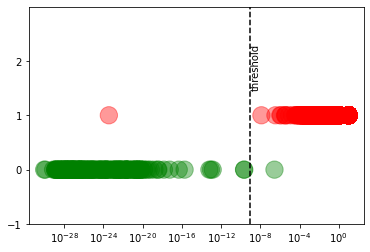

In [3]:
from pandas import read_csv
from matplotlib import pyplot as plt
import numpy as np

filename = 'testing_set.csv'
names = ['e-value', 'attribute']
data = read_csv(filename, names=names)

x = data['e-value']
y = data['attribute']
color= ['green' if l == 0 else 'red' for l in y]

Y = np.linspace(0, 1, 10)
plt.ylim([-0.2,3])
plt.yticks(np.arange(-1, 3, 1))
plt.scatter(x,y, alpha = 0.4, s = 300, c = color )
plt.xscale('log')
plt.axvline(1e-09, c ='black', ls ='dashed')
plt.savefig('positive_negative.png')
plt.text(1e-9,1.5,'threshold',rotation=90)

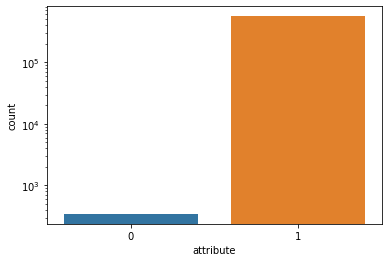

In [89]:
import seaborn as sns

sns.countplot(data['attribute'], label="Sum",  )
plt.yscale('log')
plt.show()

In [17]:
false =  data[data['attribute']==1]
true =  data[data['attribute']==0]
print(false.shape, true.shape)

(280925, 2) (172, 2)


In [18]:
!cat neg_pos-set1.id neg_pos-set2.id > neg_pos-total.final

In [22]:
!awk '{print $2, $3}' neg_pos-total.final | sed 's/ /,/g' | sed 's/\n//g' > alldata.csv

In [24]:
!tail alldata.csv

10,1
10,1
10,1
10,1
10,1
10,1
10,1
10,1
10,1
10,1


In [152]:
f = 'testing_set.csv'
names = ['e-value', 'attribute']
data = read_csv(f, names=names)

data.shape

(281097, 2)

In [165]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data[['e-value']], data['attribute'], train_size = 0.8)

X_test

,e-value
250892,10.00
12954,0.12
23647,0.22
178044,10.00
142088,10.00
...,...
152360,10.00
102233,1.00
257963,10.00
234870,10.00


In [167]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [177]:
model.predict_proba(X_test)

Y_pred = model.predict(X_test)

In [173]:
model.score(X_test,y_test)

0.999501956599075

In [179]:
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, log_loss
cm = confusion_matrix(y_test, Y_pred)
acc = accuracy_score(y_test, Y_pred)
F1 = f1_score(y_test, Y_pred, average="micro") 

print(cm, acc, F1)

[[    0    28]
 [    0 56192]] 0.999501956599075 0.999501956599075
